# Análise e classificação de faces com OpenCV

## Imports

In [48]:
import cv2
import dlib

import matplotlib.pyplot as plt
import seaborn

from os import listdir, path, makedirs
from os.path import isfile, join
import shutil

import numpy as np
from sklearn.metrics import accuracy_score
from scipy.spatial import distance as dist

from io import BytesIO
from IPython.display import clear_output, Image, display
from PIL import Image as Img

## Explorando uma imagem...

In [7]:
imagem = cv2.imread("imagens/px-girl.jpg")

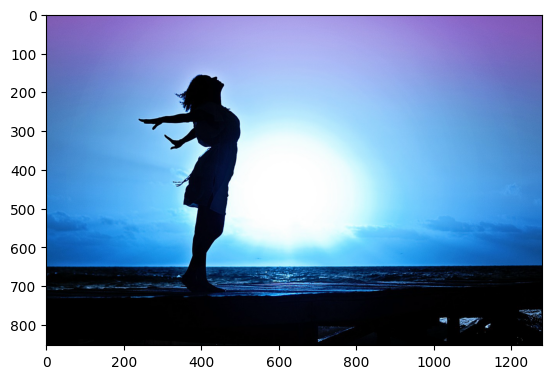

In [8]:
plt.imshow(imagem)

In [9]:
#Alterando escala de cores para RGB (originalmente gera em BGR)
imagem_rgb = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

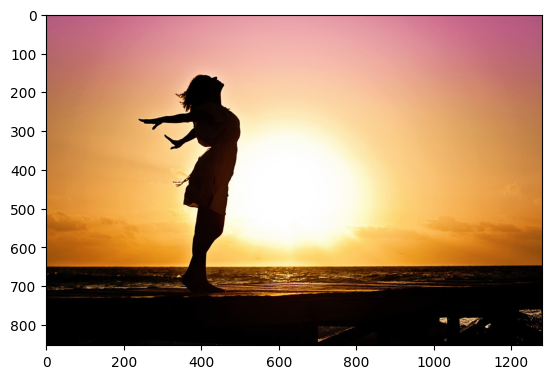

In [10]:
plt.imshow(imagem_rgb)

In [11]:
#Imagem possui 3 dimensões
imagem_rgb.shape

(853, 1280, 3)

In [12]:
#Alterando escala de cores da imagem para cinza (utiliza média das cores RGB)
imagem_gray = cv2.cvtColor(imagem_rgb, cv2.COLOR_RGB2GRAY)

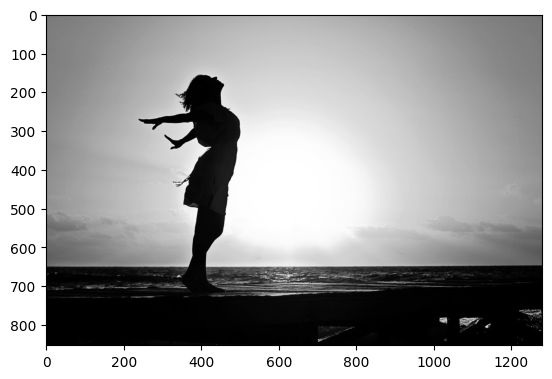

In [13]:
plt.imshow(imagem_gray, cmap='gray')

In [14]:
imagem_gray.shape

(853, 1280)

## Definando uma região de interesse...

In [15]:
imagem = cv2.imread("imagens/px-people.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

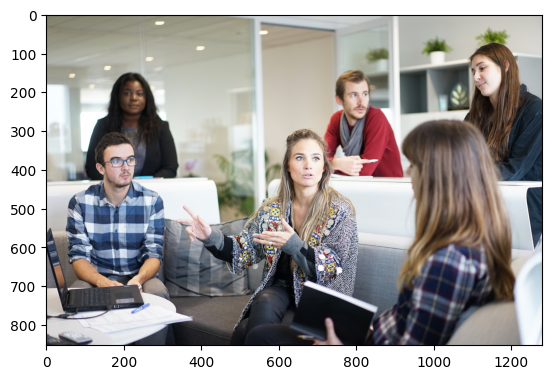

In [16]:
plt.imshow(imagem)

In [17]:
imagem.shape

(853, 1280, 3)

In [18]:
#Definindo manualmente uma região da imagem
imagem_roi = imagem[100:200, 1000:2000]

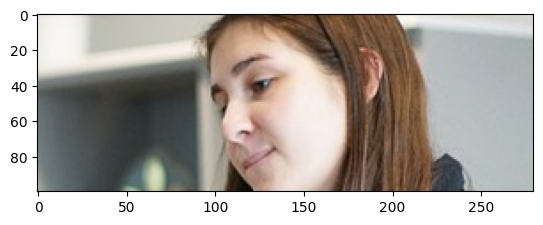

In [19]:
plt.imshow(imagem_roi)

In [20]:
#Salvando a imagem
imagem_roi_bgr = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2BGR)
cv2.imwrite("imagem_roi.png", imagem_roi_bgr)

True

In [21]:
imagem = cv2.imread("imagens/children-happy.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

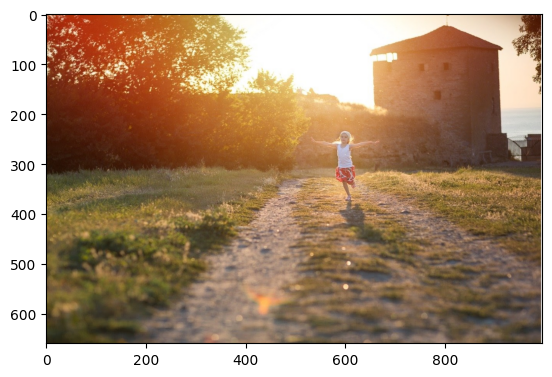

In [22]:
plt.imshow(imagem)

In [23]:
#Definindo manualmente uma região da imagem
imagem_roi = imagem[230:380, 530:670]

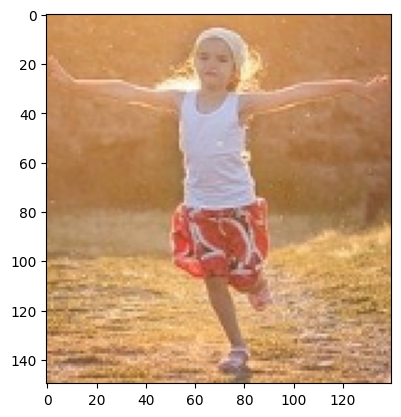

In [24]:
plt.imshow(imagem_roi)

In [25]:
#Transformando em escala de cinza
imagem_roi_gray = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2GRAY)

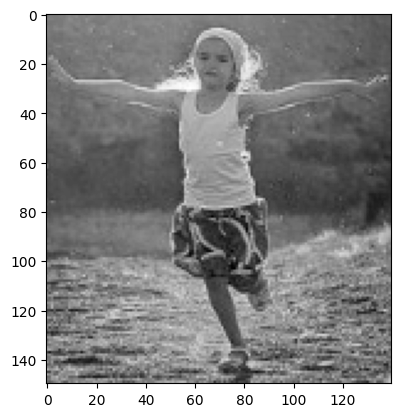

In [26]:
plt.imshow(imagem_roi_gray, cmap='gray')

In [27]:
#Voltando a imagem à escala para RGB e inserindo na imagem original
roi_rgb = cv2.cvtColor(imagem_roi_gray, cv2.COLOR_GRAY2RGB)
imagem[230:380, 530:670] = roi_rgb

Text(0.5, 1.0, 'Corpo inteiro')

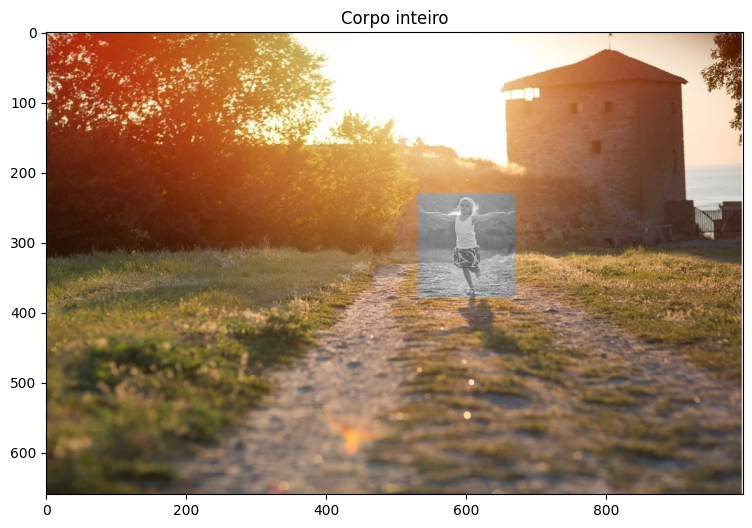

In [28]:
plt.figure(figsize=(15,6))
plt.imshow(imagem)
plt.title("Corpo inteiro")

## Classificador de cascata de Haar

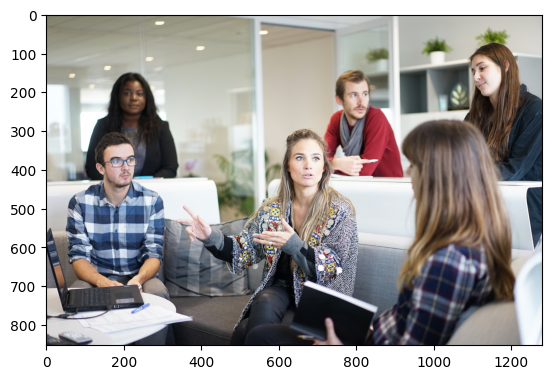

In [29]:
imagem = cv2.imread("imagens/px-people.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
plt.imshow(imagem)

In [30]:
imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_RGB2GRAY)

In [31]:
classificador = cv2.CascadeClassifier("classificadores/haarcascade_frontalface_default.xml")

In [32]:
faces = classificador.detectMultiScale(imagem_gray, 1.3, 5)

In [33]:
len(faces)

5

## Trabalhando com regiões de interesse...

In [34]:
#Coordenadas do recorte
faces[0]

array([1088,  102,  101,  101])

In [35]:
imagem_anotada = imagem.copy()

In [36]:
for (x,y,w,h) in faces:
    cv2.rectangle(imagem_anotada, (x,y), (x+w, y+h), (255,255,0), 2)

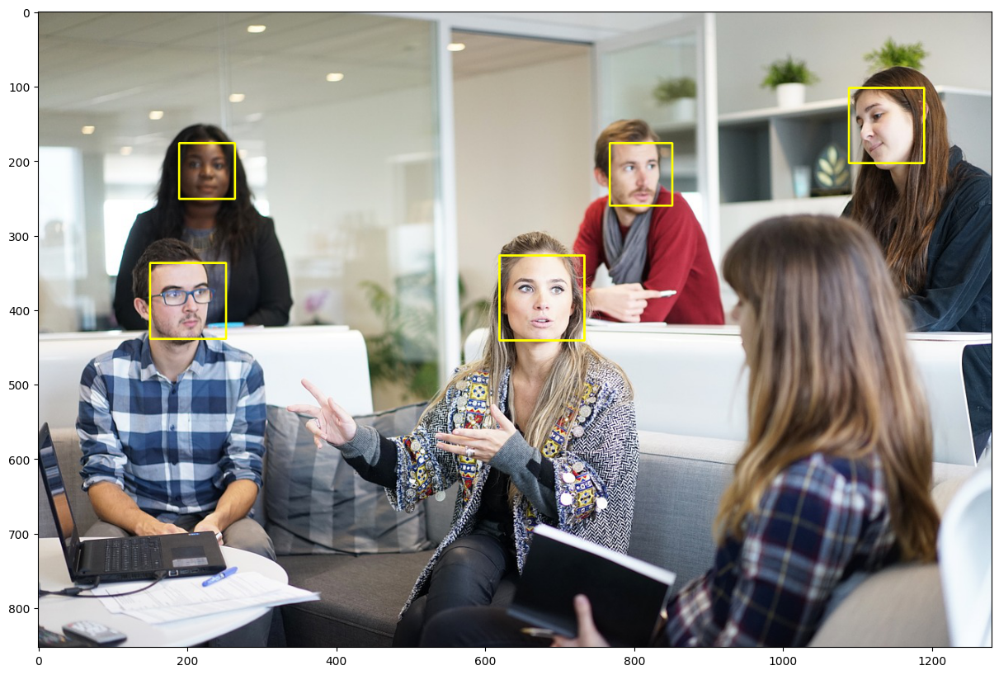

In [37]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_anotada)

In [38]:
face_imagem = 0

for (x,y,w,h) in faces:
    face_imagem += 1
    imagem_roi = imagem[y:y+h, x:x+w]
    imagem_roi = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2BGR)
    cv2.imwrite("face_" + str(face_imagem) + ".png", imagem_roi)

### Mais um exemplo

In [39]:
for i in range(3):
    imagem = cv2.imread("imagens/woman"+str(i+1)+".jpg")
    imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
    imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_RGB2GRAY)
    classificador = cv2.CascadeClassifier("classificadores/haarcascade_frontalface_default.xml")
    faces = classificador.detectMultiScale(imagem_gray, 1.3, 5)
    imagem_anotada = imagem.copy()
    for (x,y,w,h) in faces:
        imagem_roi = imagem[y:y+h, x:x+w]
        imagem_roi = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2BGR)
        cv2.imwrite("face_woman_" + str(i+1) + ".png", imagem_roi)

## Treinando um modelo de reconhecimento de faces

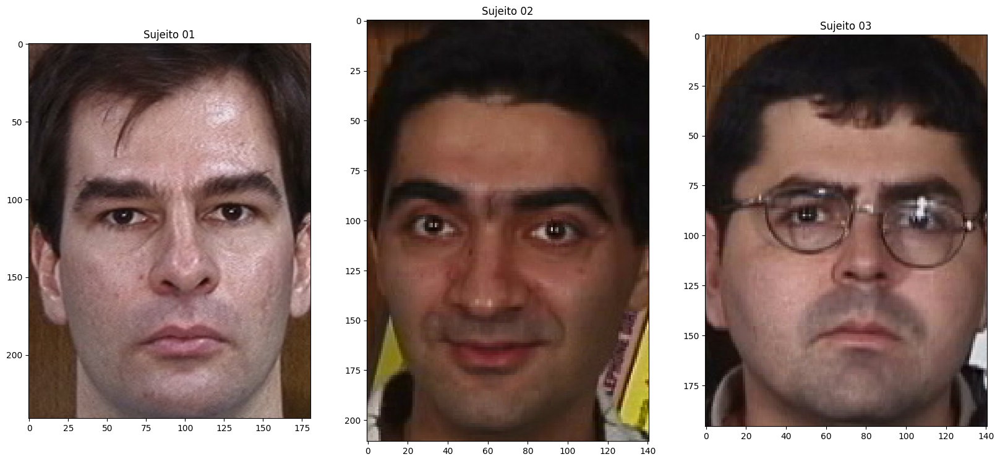

In [40]:
imagem_face_1 = cv2.imread("imagens/cropped_faces/s01_01.jpg")
imagem_face_1 = cv2.cvtColor(imagem_face_1, cv2.COLOR_BGR2RGB)

imagem_face_2 = cv2.imread("imagens/cropped_faces/s02_01.jpg")
imagem_face_2 = cv2.cvtColor(imagem_face_2, cv2.COLOR_BGR2RGB)

imagem_face_3 = cv2.imread("imagens/cropped_faces/s03_01.jpg")
imagem_face_3 = cv2.cvtColor(imagem_face_3, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.subplot(131)
plt.title("Sujeito 01")
plt.imshow(imagem_face_1)

plt.subplot(132)
plt.title("Sujeito 02")
plt.imshow(imagem_face_2)

plt.subplot(133)
plt.title("Sujeito 03")
plt.imshow(imagem_face_3)

plt.show()

In [41]:
faces_caminho = "imagens/cropped_faces/"
lista_arq_faces = [f for f in listdir(faces_caminho) if isfile(join(faces_caminho, f))]

In [42]:
faces_path_treino = "imagens/treino/"
faces_path_teste = "imagens/teste/"

if not path.exists(faces_path_treino):
    makedirs(faces_path_treino)
    
if not path.exists(faces_path_teste):
    makedirs(faces_path_teste)
    
for arq in lista_arq_faces:
    sujeito = arq[1:3]
    numero = arq[4:6]
    
    if int(numero) <= 10:
        shutil.copyfile(faces_caminho + arq, faces_path_treino + arq)
    else:
        shutil.copyfile(faces_caminho + arq, faces_path_teste + arq)

In [43]:
def padronizar_imagem(imagem_caminho):
    imagem = cv2.imread(imagem_caminho, cv2.IMREAD_GRAYSCALE)
    imagem = cv2.resize(imagem, (200,200), interpolation=cv2.INTER_LANCZOS4)
    return imagem

In [44]:
lista_faces_treino = [f for f in listdir(faces_path_treino) if isfile(join(faces_path_treino, f))]
lista_faces_teste = [f for f in listdir(faces_path_teste) if isfile(join(faces_path_teste, f))]

In [45]:
dados_treinamento, dados_teste, sujeitos, sujeitos_teste = [], [], [], []

In [46]:
for i, arq in enumerate(lista_faces_treino):
    imagem_path = faces_path_treino + arq
    imagem = padronizar_imagem(imagem_path)
    dados_treinamento.append(imagem)
    sujeito = arq[1:3]
    sujeitos.append(int(sujeito))

In [47]:
for i, arq in enumerate(lista_faces_teste):
    imagem_path = faces_path_teste + arq
    imagem = padronizar_imagem(imagem_path)
    dados_teste.append(imagem)
    sujeito = arq[1:3]
    sujeitos_teste.append(int(sujeito))

### Mais um exemplo

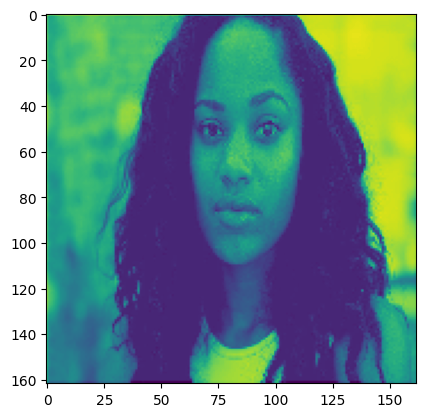

In [48]:
for i in range(3):
    imagem = cv2.imread("imagens/woman"+str(i+1)+".jpg", cv2.IMREAD_GRAYSCALE)
    imagem = cv2.resize(imagem, (162,162), interpolation=cv2.INTER_LANCZOS4)
    plt.imshow(imagem)

## Classificador Eigenface

In [49]:
sujeitos = np.asarray(sujeitos, dtype=np.int32)
sujeitos_teste = np.asarray(sujeitos_teste, dtype=np.int32)

In [50]:
modelo_eigenfaces = cv2.face.EigenFaceRecognizer_create()

In [51]:
modelo_eigenfaces.train(dados_treinamento, sujeitos)

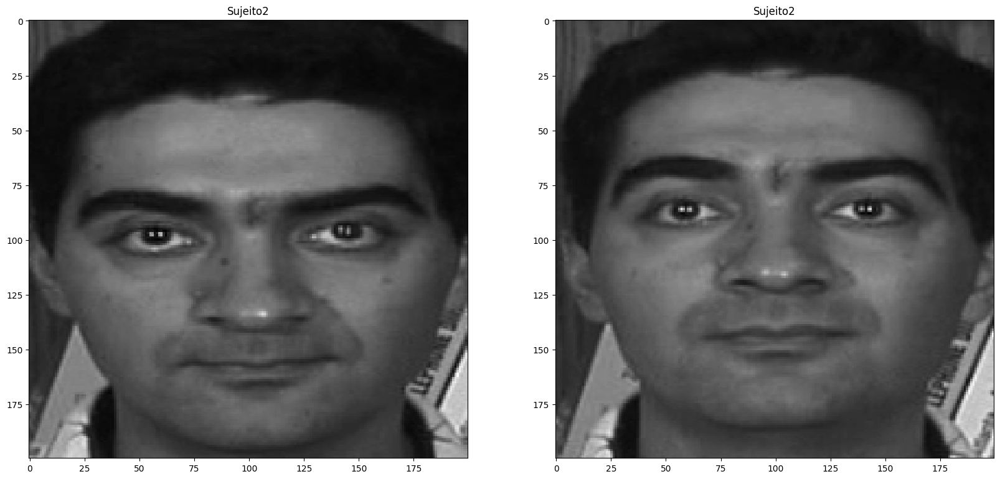

In [52]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.title("Sujeito" + str(sujeitos_teste[6]))
plt.imshow(dados_teste[6], cmap="gray")

plt.subplot(122)
plt.title("Sujeito" + str(sujeitos_teste[7]))
plt.imshow(dados_teste[7], cmap="gray")

plt.show()

In [53]:
predicao = modelo_eigenfaces.predict(dados_teste[6])
predicao

(32, 4817.268663542458)

In [54]:
predicao = modelo_eigenfaces.predict(dados_teste[7])
predicao

(2, 3820.2138342716853)

## Classificador Fisherface

In [55]:
modelo_fisherfaces = cv2.face.FisherFaceRecognizer_create()

In [56]:
modelo_fisherfaces.train(dados_treinamento, sujeitos)

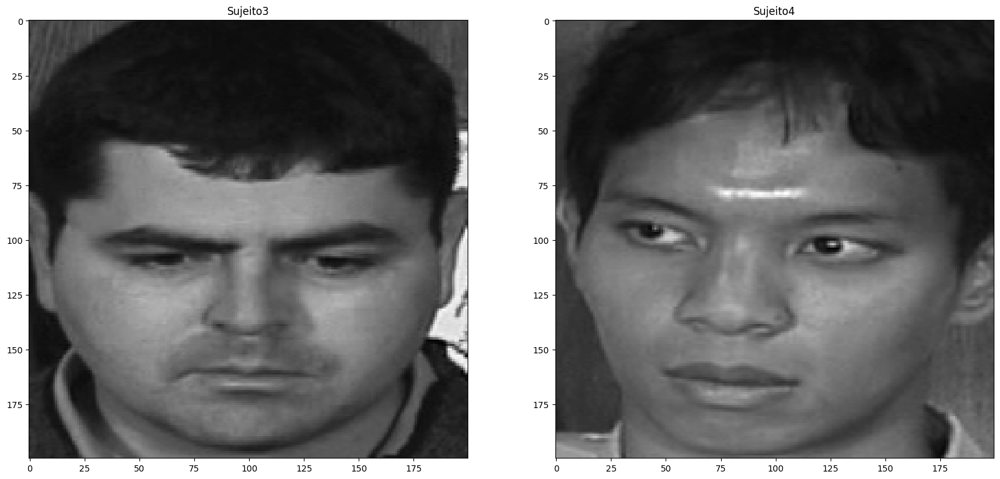

In [57]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.title("Sujeito" + str(sujeitos_teste[13]))
plt.imshow(dados_teste[13], cmap="gray")

plt.subplot(122)
plt.title("Sujeito" + str(sujeitos_teste[19]))
plt.imshow(dados_teste[19], cmap="gray")

plt.show()

In [58]:
predicao = modelo_fisherfaces.predict(dados_teste[13])
predicao

(3, 890.3359324954002)

In [59]:
predicao = modelo_fisherfaces.predict(dados_teste[19])
predicao

(4, 795.1654305178304)

## Classificador LBPH

In [60]:
modelo_lbph = cv2.face.LBPHFaceRecognizer_create()

In [61]:
modelo_lbph.train(dados_treinamento, sujeitos)

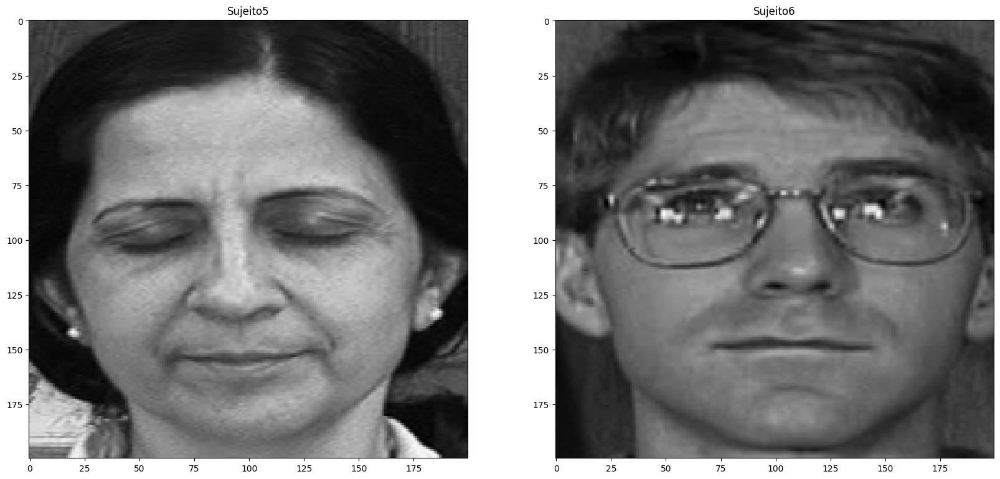

In [62]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.title("Sujeito" + str(sujeitos_teste[21]))
plt.imshow(dados_teste[21], cmap="gray")

plt.subplot(122)
plt.title("Sujeito" + str(sujeitos_teste[27]))
plt.imshow(dados_teste[27], cmap="gray")

plt.show()

In [63]:
predicao = modelo_fisherfaces.predict(dados_teste[21])
predicao

(5, 1066.853215535869)

In [64]:
predicao = modelo_fisherfaces.predict(dados_teste[27])
predicao

(32, 894.9787824228202)

## Precisão dos algoritmos

In [65]:
y_pred_eigenfaces = []

In [66]:
for item in dados_teste:
    y_pred_eigenfaces.append(modelo_eigenfaces.predict(item)[0])

In [72]:
acuracia_eigenfaces = accuracy_score(sujeitos_teste, y_pred_eigenfaces)

In [73]:
acuracia_eigenfaces

0.724

In [74]:
y_pred_fisherfaces = []

In [75]:
for item in dados_teste:
    y_pred_fisherfaces.append(modelo_fisherfaces.predict(item)[0])

In [76]:
acuracia_fisherfaces = accuracy_score(sujeitos_teste, y_pred_fisherfaces)

In [77]:
acuracia_fisherfaces

0.52

In [78]:
y_pred_lbph = []

In [79]:
for item in dados_teste:
    y_pred_lbph.append(modelo_lbph.predict(item)[0])

In [80]:
acuracia_lbph = accuracy_score(sujeitos_teste, y_pred_lbph)

In [81]:
acuracia_lbph

0.792

## DLib

In [3]:
imagem = cv2.imread("imagens/px-woman-smilings.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

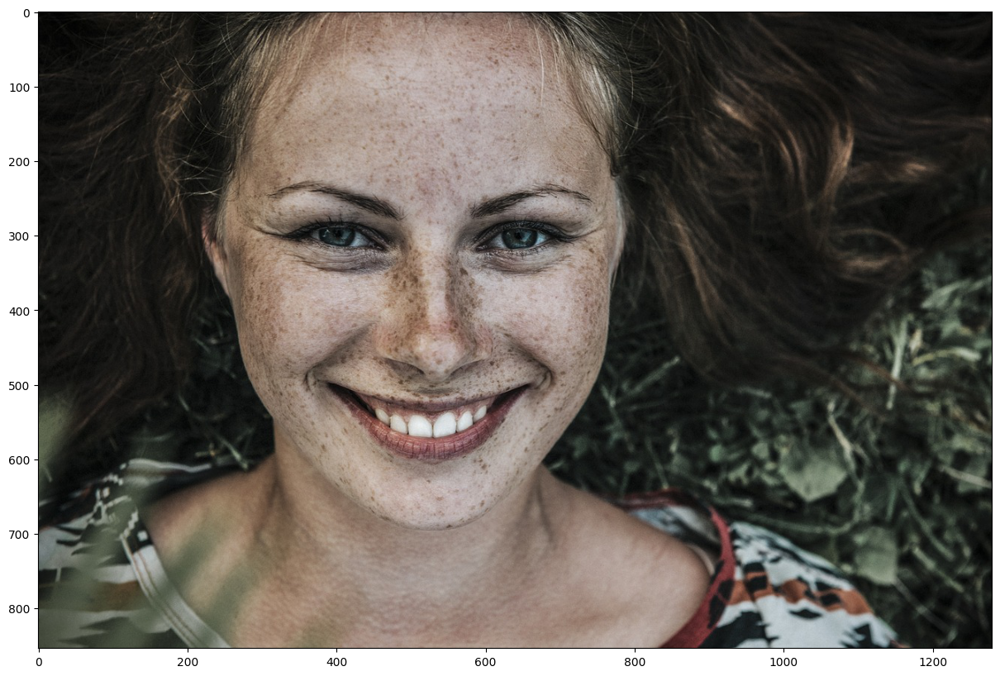

In [4]:
plt.figure(figsize=(20,10))
plt.imshow(imagem)

In [7]:
classificador_dlib_68_path = "classificadores/shape_predictor_68_face_landmarks.dat"
classificador_dlib = dlib.shape_predictor(classificador_dlib_68_path)
detector_face = dlib.get_frontal_face_detector()

In [8]:
def anotar_rosto(imagem):
    retangulos = detector_face(imagem, 1)
    
    if len(retangulos) == 0:
        return None
    
    for k, d in enumerate(retangulos):
        print("Indentificado rosto " + str(k))
        cv2.rectangle(imagem, (d.left(), d.top()), (d.right(), d.bottom()), (255,255,0), 2)
        
    return imagem

In [9]:
imagem_anotada = imagem.copy()
imagem_anotada = anotar_rosto(imagem_anotada)

Indentificado rosto 0


## Extração dos marcos faciais

In [12]:
def pontos_marcos_faciais(imagem):
    retangulos = detector_face(imagem, 1)
    
    if len(retangulos) == 0:
        return None
    
    marcos = []
    
    for ret in retangulos:
        marcos.append(np.matrix([[p.x, p.y] for p in classificador_dlib(imagem, ret).parts()]))
        
    return marcos

In [13]:
marcos_faciais = pontos_marcos_faciais(imagem)

In [14]:
def anotar_marcos_faciais(imagem, marcos):
    
    for marco in marcos:
        for idx, ponto in enumerate(marco):
            centro = (ponto[0,0], ponto[0,1])
            cv2.circle(imagem, centro, 3, (255,255,0), -1)
            cv2.putText(imagem, str(idx), centro, cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,255,255), 2)
            
    return imagem

In [15]:
imagem_anotada = imagem.copy()
imagem_anotada = anotar_marcos_faciais(imagem_anotada, marcos_faciais)

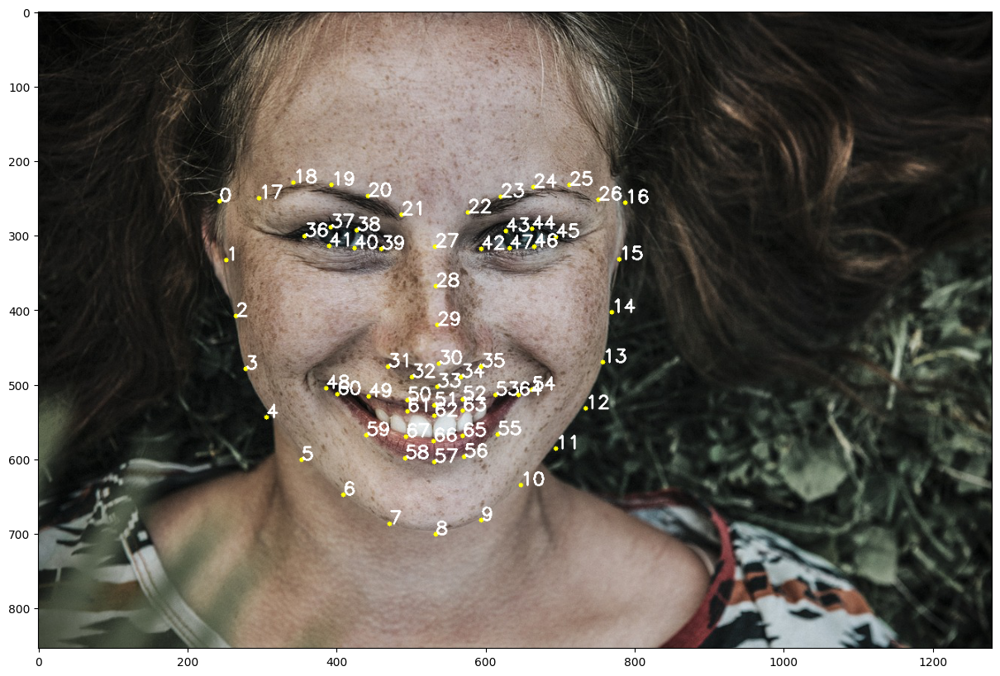

In [16]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_anotada)

In [19]:
imagem_pessoa = cv2.imread("imagens/px-man-happy.jpg")
imagem_pessoa = cv2.cvtColor(imagem_pessoa, cv2.COLOR_BGR2RGB)

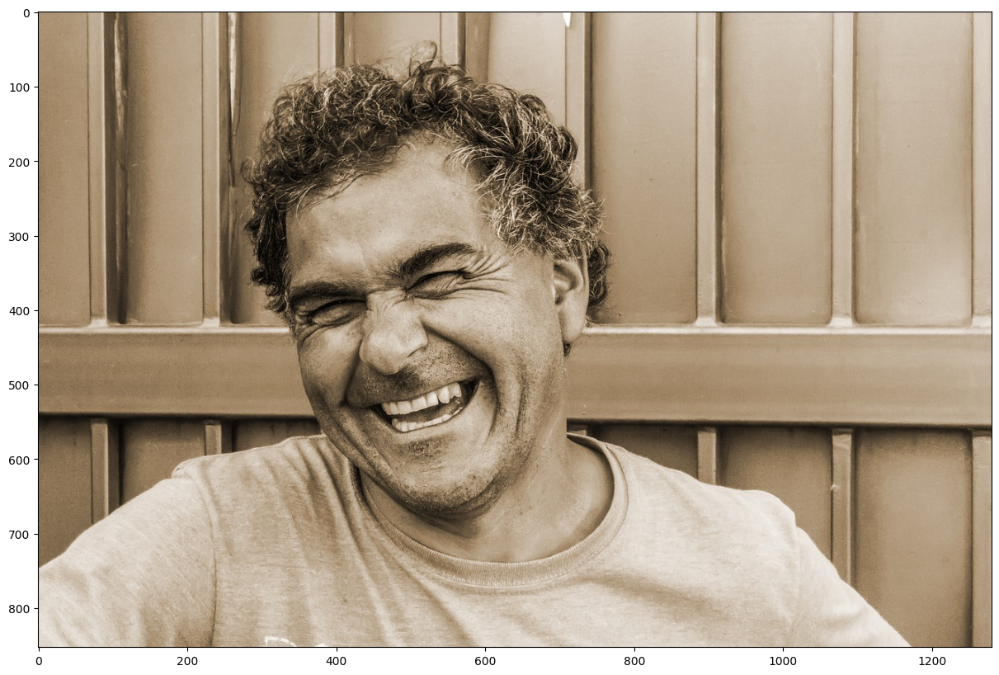

In [20]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_pessoa)

In [21]:
imagem_anotada = imagem_pessoa.copy()
marcos_faciais = pontos_marcos_faciais(imagem_anotada)
imagem_anotada = anotar_marcos_faciais(imagem_anotada, marcos_faciais)

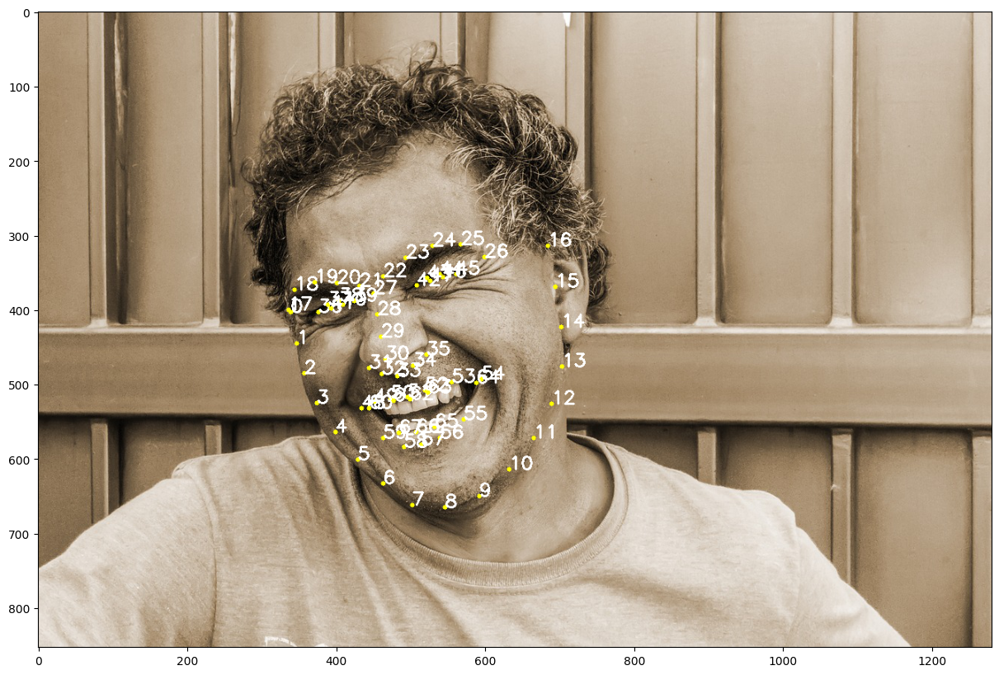

In [22]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_anotada)

## Medidas de aspecto de razão

In [24]:
FACE = list(range(17, 68))
FACE_COMPLETA = list(range(0, 68))
LABIO = list(range(48, 61))
SOMBRANCELHA_DIREITA = list(range(17, 22))
SOMBRANCELHA_ESQUERDA = list(range(22, 27))
OLHO_DIREITO = list(range(36, 42))
OLHO_ESQUERDO = list(range(42, 48))
NARIZ = list(range(27, 35))
MANDIBULA = list(range(0, 17))

In [43]:
def aspecto_razao_olhos(pontos_olhos):
    
    a = dist.euclidean(pontos_olhos[1], pontos_olhos[5])
    b = dist.euclidean(pontos_olhos[2], pontos_olhos[4])    
    c = dist.euclidean(pontos_olhos[0], pontos_olhos[3])
    
    aspecto_razao = (a + b) / (2.0 * c)
    
    return aspecto_razao

In [37]:
def anotar_marcos_faciais_casca_convexa(imagem, marcos):
    retangulos = detector_face(imagem, 1)
    
    if len(retangulos) == 0:
        return None
    
    for idx, ret in enumerate(retangulos):
        marco = marcos[idx]
        
        pontos = cv2.convexHull(marco[OLHO_ESQUERDO])
        cv2.drawContours(imagem, [pontos], 0, (0,255,0), 2)
        
        pontos = cv2.convexHull(marco[OLHO_DIREITO])
        cv2.drawContours(imagem, [pontos], 0, (0,255,0), 2)
        
    return imagem

In [38]:
imagem_anotada = imagem_pessoa.copy()
imagem_anotada = anotar_marcos_faciais_casca_convexa(imagem_anotada, marcos_faciais)

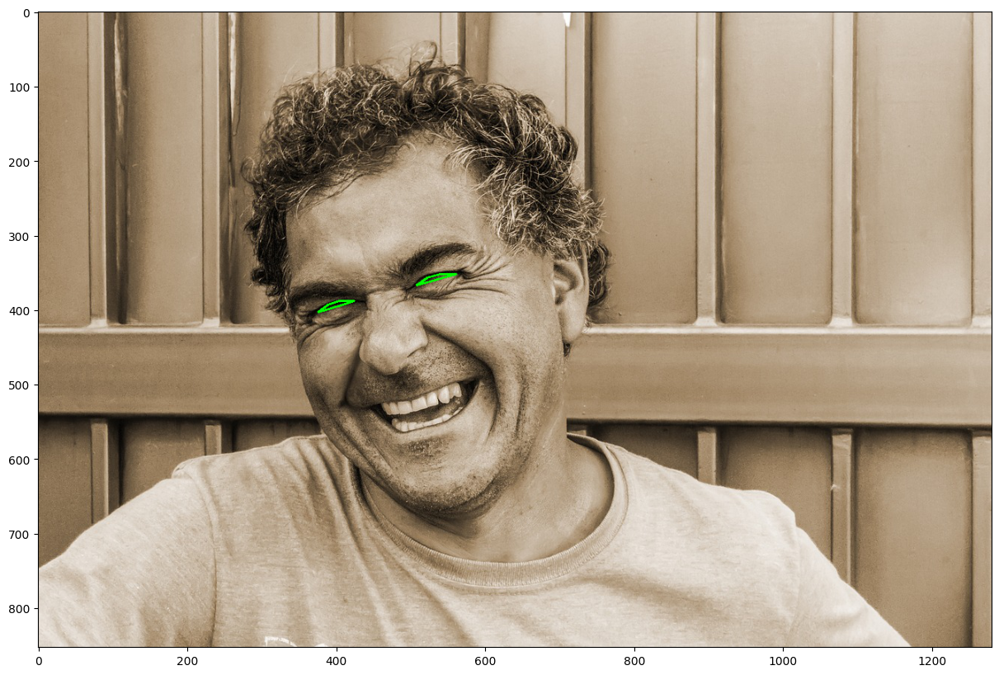

In [39]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_anotada)

## Trabalhando com vídeos

In [49]:
def padronizar_imagem(frame):
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    frame = cv2.resize(frame, (500,400))
    return frame

In [50]:
def exibir_video(frame):
    img = Img.fromarray(frame, "RGB")
    buffer = BytesIO()
    img.save(buffer, format='JPEG')
    display(Image(data=buffer.getvalue()))
    clear_output(wait=True)

In [52]:
video = cv2.VideoCapture("videos/expressoes.mov")

try:
    while(True):
        captura_ok, frame = video.read()
        if captura_ok:
            frame = padronizar_imagem(frame)
            exibir_video(frame)
except KeyboardInterrupt:
    video.release()
    print("Interrompido")

Interrompido
